# Predicting Prices in Ride-hailing Services

##### Accurate Price Predictions:

The primary expected outcome is to build a predictive model that can accurately estimate ride-hailing prices. The model should minimize prediction errors and enable ride hailing companies provide fare estimates that are accurate and inline with the actual prices.  
This will provide a competitive advantage to the company in the ride-hailing market as being able to offer competitive and transparent pricing can attract and retain customers.
It would also result in an improved customer experience and satisfaction as accurate predictions reduce the likelihood of surprise price changes.
   

##### Data-Driven Insights:

The project will also strive to understand and gain valuable insights into how various factors (e.g., time of day, distance, weather, surge multiplier) impact cab fares. These insights can inform business decisions and marketing strategies.




# Data Description

There are two data files in the dataset:

- cab_rides.csv: Consists of the details of each ride along with its corresponding price.

- weather.csv: Consists of the components of weather conditions at a particular instant of time.

In [4]:
#Import neccessary packages for this project
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
sns.set()
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score,auc,ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score, balanced_accuracy_score, classification_report
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import r2_score, mean_absolute_error
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import median_absolute_error
from sklearn.linear_model import HuberRegressor


In [5]:
#Read in the Rides data
rides = pd.read_csv("cab_rides.csv")

In [6]:
#View few rows
rides.head()

,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,name
0,0.44,Lyft,1544952607890,North Station,Haymarket Square,5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,lyft_line,Shared
1,0.44,Lyft,1543284023677,North Station,Haymarket Square,11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,lyft_premier,Lux
2,0.44,Lyft,1543366822198,North Station,Haymarket Square,7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,lyft,Lyft
3,0.44,Lyft,1543553582749,North Station,Haymarket Square,26.0,1.0,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,lyft_luxsuv,Lux Black XL
4,0.44,Lyft,1543463360223,North Station,Haymarket Square,9.0,1.0,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,lyft_plus,Lyft XL


Data Dictionary:
    
- distance: distance between source and destination
- cab_type: Uber or Lyft
- time_stamp: epoch time when data was queried
- destination: destination of the ride
- source: the starting point of the ride
- price: price estimate for the ride in USD
- surge_multiplier: surge_multiplier: The surge multiplier applied to the price during peak hours or high demand, default is 1
- id: unique identifier
- product_id: uber/lyft identifier for cab-type
- name: visible type of the cab: eg: Uber Pool, UberXL

In [7]:
#Read in the weather data
weather = pd.read_csv("weather.csv")
weather.head()

,temp,location,clouds,pressure,rain,time_stamp,humidity,wind
0,42.42,Back Bay,1.0,1012.14,0.1228,1545003901,0.77,11.25
1,42.43,Beacon Hill,1.0,1012.15,0.1846,1545003901,0.76,11.32
2,42.50,Boston University,1.0,1012.15,0.1089,1545003901,0.76,11.07
3,42.11,Fenway,1.0,1012.13,0.0969,1545003901,0.77,11.09
4,43.13,Financial District,1.0,1012.14,0.1786,1545003901,0.75,11.49


Data Dictionary
- temp: temperature in F
- location: The specific location associated with the weather data.
- clouds: The cloud coverage (ranging from 0.0 to 1.0, where 0.0 represents clear skies and 1.0 represents fully cloudy).
- pressure: pressure in mb
- rain: rain in inches for the last hr
- time_stamp: epoch time when row data was collected
- humidity: humidity in %
- wind: wind speed in mph

# Data Preprocessing

First, we will try basic steps which involve data cleaning like removing null values, changing the date_time to the desired format, andother data preprocessing steps.

In [8]:
#convert the timestamp into the desirable format
rides['date_time'] = pd.to_datetime(rides['time_stamp']/1000, unit='s')
weather['date_time'] = pd.to_datetime(weather['time_stamp'], unit='s')

- rides['time_stamp'] refers to the 'time_stamp' column in the 'rides' DataFrame.
- /1000 is used to convert the Unix timestamps from milliseconds to seconds, which is the unit expected by the to_datetime() function.
- unit='s' specifies that the input values are in seconds.

In [9]:
rides.head()

,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,name,date_time
0,0.44,Lyft,1544952607890,North Station,Haymarket Square,5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,lyft_line,Shared,2018-12-16 09:30:07.890000128
1,0.44,Lyft,1543284023677,North Station,Haymarket Square,11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,lyft_premier,Lux,2018-11-27 02:00:23.676999936
2,0.44,Lyft,1543366822198,North Station,Haymarket Square,7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,lyft,Lyft,2018-11-28 01:00:22.197999872
3,0.44,Lyft,1543553582749,North Station,Haymarket Square,26.0,1.0,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,lyft_luxsuv,Lux Black XL,2018-11-30 04:53:02.749000192
4,0.44,Lyft,1543463360223,North Station,Haymarket Square,9.0,1.0,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,lyft_plus,Lyft XL,2018-11-29 03:49:20.223000064


In [10]:
weather.head()

,temp,location,clouds,pressure,rain,time_stamp,humidity,wind,date_time
0,42.42,Back Bay,1.0,1012.14,0.1228,1545003901,0.77,11.25,2018-12-16 23:45:01
1,42.43,Beacon Hill,1.0,1012.15,0.1846,1545003901,0.76,11.32,2018-12-16 23:45:01
2,42.50,Boston University,1.0,1012.15,0.1089,1545003901,0.76,11.07,2018-12-16 23:45:01
3,42.11,Fenway,1.0,1012.13,0.0969,1545003901,0.77,11.09,2018-12-16 23:45:01
4,43.13,Financial District,1.0,1012.14,0.1786,1545003901,0.75,11.49,2018-12-16 23:45:01


In [11]:
#make a coloumn of merge date containing date merged with the location 
#so that we can join the two dataframes on the basis of 'merge_date'
rides['merge_date'] = rides.source.astype(str) +" - "+ rides.date_time.dt.date.astype("str") +" - "+ rides.date_time.dt.hour.astype("str")
weather['merge_date'] = weather.location.astype(str) +" - "+ weather.date_time.dt.date.astype("str") +" - "+ weather.date_time.dt.hour.astype("str")

In [12]:
weather.head()

,temp,location,clouds,pressure,rain,time_stamp,humidity,wind,date_time,merge_date
0,42.42,Back Bay,1.0,1012.14,0.1228,1545003901,0.77,11.25,2018-12-16 23:45:01,Back Bay - 2018-12-16 - 23
1,42.43,Beacon Hill,1.0,1012.15,0.1846,1545003901,0.76,11.32,2018-12-16 23:45:01,Beacon Hill - 2018-12-16 - 23
2,42.50,Boston University,1.0,1012.15,0.1089,1545003901,0.76,11.07,2018-12-16 23:45:01,Boston University - 2018-12-16 - 23
3,42.11,Fenway,1.0,1012.13,0.0969,1545003901,0.77,11.09,2018-12-16 23:45:01,Fenway - 2018-12-16 - 23
4,43.13,Financial District,1.0,1012.14,0.1786,1545003901,0.75,11.49,2018-12-16 23:45:01,Financial District - 2018-12-16 - 23


In [13]:
# change the index to merge_date column so joining the two datasets will not generate any error.
weather.index = weather['merge_date']
weather.head()

,temp,location,clouds,pressure,rain,time_stamp,humidity,wind,date_time,merge_date
merge_date,,,,,,,,,,
Back Bay - 2018-12-16 - 23,42.42,Back Bay,1.0,1012.14,0.1228,1545003901,0.77,11.25,2018-12-16 23:45:01,Back Bay - 2018-12-16 - 23
Beacon Hill - 2018-12-16 - 23,42.43,Beacon Hill,1.0,1012.15,0.1846,1545003901,0.76,11.32,2018-12-16 23:45:01,Beacon Hill - 2018-12-16 - 23
Boston University - 2018-12-16 - 23,42.50,Boston University,1.0,1012.15,0.1089,1545003901,0.76,11.07,2018-12-16 23:45:01,Boston University - 2018-12-16 - 23
Fenway - 2018-12-16 - 23,42.11,Fenway,1.0,1012.13,0.0969,1545003901,0.77,11.09,2018-12-16 23:45:01,Fenway - 2018-12-16 - 23
Financial District - 2018-12-16 - 23,43.13,Financial District,1.0,1012.14,0.1786,1545003901,0.75,11.49,2018-12-16 23:45:01,Financial District - 2018-12-16 - 23


In [14]:
final_dataframe = rides.join(weather,on=['merge_date'],rsuffix ='_w')
#drop the null values rows
final_dataframe=final_dataframe.dropna(axis=0)

In [15]:
final_dataframe.head()

,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,name,date_time,merge_date,temp,location,clouds,pressure,rain,time_stamp_w,humidity,wind,date_time_w,merge_date_w
1,0.44,Lyft,1543284023677,North Station,Haymarket Square,11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,lyft_premier,Lux,2018-11-27 02:00:23.676999936,Haymarket Square - 2018-11-27 - 2,44.31,Haymarket Square,1.00,1003.17,0.1123,1.543285e+09,0.90,13.69,2018-11-27 02:15:20,Haymarket Square - 2018-11-27 - 2
1,0.44,Lyft,1543284023677,North Station,Haymarket Square,11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,lyft_premier,Lux,2018-11-27 02:00:23.676999936,Haymarket Square - 2018-11-27 - 2,43.82,Haymarket Square,0.99,1002.59,0.0997,1.543287e+09,0.89,11.57,2018-11-27 02:45:20,Haymarket Square - 2018-11-27 - 2
9,1.08,Lyft,1543315522249,Northeastern University,Back Bay,27.5,1.0,8612d909-98b8-4454-a093-30bd48de0cb3,lyft_luxsuv,Lux Black XL,2018-11-27 10:45:22.249000192,Back Bay - 2018-11-27 - 10,44.56,Back Bay,0.99,990.78,0.0213,1.543314e+09,0.96,5.87,2018-11-27 10:15:20,Back Bay - 2018-11-27 - 10
9,1.08,Lyft,1543315522249,Northeastern University,Back Bay,27.5,1.0,8612d909-98b8-4454-a093-30bd48de0cb3,lyft_luxsuv,Lux Black XL,2018-11-27 10:45:22.249000192,Back Bay - 2018-11-27 - 10,44.95,Back Bay,0.99,990.87,0.0087,1.543316e+09,0.97,6.14,2018-11-27 10:45:20,Back Bay - 2018-11-27 - 10
15,1.11,Uber,1545004511430,West End,North End,7.5,1.0,50ef1165-9d23-416c-a65c-18906207b295,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,WAV,2018-12-16 23:55:11.430000128,North End - 2018-12-16 - 23,42.36,North End,1.00,1012.15,0.2088,1.545004e+09,0.77,11.46,2018-12-16 23:45:01,North End - 2018-12-16 - 23


In [16]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 190311 entries, 1 to 693058
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   distance          190311 non-null  float64       
 1   cab_type          190311 non-null  object        
 2   time_stamp        190311 non-null  int64         
 3   destination       190311 non-null  object        
 4   source            190311 non-null  object        
 5   price             190311 non-null  float64       
 6   surge_multiplier  190311 non-null  float64       
 7   id                190311 non-null  object        
 8   product_id        190311 non-null  object        
 9   name              190311 non-null  object        
 10  date_time         190311 non-null  datetime64[ns]
 11  merge_date        190311 non-null  object        
 12  temp              190311 non-null  float64       
 13  location          190311 non-null  object        
 14  clou

In [17]:
#make different columns of day and hour to simplify the format of date 
final_dataframe['day'] = final_dataframe.date_time.dt.dayofweek
final_dataframe['hour'] = final_dataframe.date_time.dt.hour

In [18]:
final_dataframe.head()

,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,name,date_time,merge_date,temp,location,clouds,pressure,rain,time_stamp_w,humidity,wind,date_time_w,merge_date_w,day,hour
1,0.44,Lyft,1543284023677,North Station,Haymarket Square,11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,lyft_premier,Lux,2018-11-27 02:00:23.676999936,Haymarket Square - 2018-11-27 - 2,44.31,Haymarket Square,1.00,1003.17,0.1123,1.543285e+09,0.90,13.69,2018-11-27 02:15:20,Haymarket Square - 2018-11-27 - 2,1,2
1,0.44,Lyft,1543284023677,North Station,Haymarket Square,11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,lyft_premier,Lux,2018-11-27 02:00:23.676999936,Haymarket Square - 2018-11-27 - 2,43.82,Haymarket Square,0.99,1002.59,0.0997,1.543287e+09,0.89,11.57,2018-11-27 02:45:20,Haymarket Square - 2018-11-27 - 2,1,2
9,1.08,Lyft,1543315522249,Northeastern University,Back Bay,27.5,1.0,8612d909-98b8-4454-a093-30bd48de0cb3,lyft_luxsuv,Lux Black XL,2018-11-27 10:45:22.249000192,Back Bay - 2018-11-27 - 10,44.56,Back Bay,0.99,990.78,0.0213,1.543314e+09,0.96,5.87,2018-11-27 10:15:20,Back Bay - 2018-11-27 - 10,1,10
9,1.08,Lyft,1543315522249,Northeastern University,Back Bay,27.5,1.0,8612d909-98b8-4454-a093-30bd48de0cb3,lyft_luxsuv,Lux Black XL,2018-11-27 10:45:22.249000192,Back Bay - 2018-11-27 - 10,44.95,Back Bay,0.99,990.87,0.0087,1.543316e+09,0.97,6.14,2018-11-27 10:45:20,Back Bay - 2018-11-27 - 10,1,10
15,1.11,Uber,1545004511430,West End,North End,7.5,1.0,50ef1165-9d23-416c-a65c-18906207b295,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,WAV,2018-12-16 23:55:11.430000128,North End - 2018-12-16 - 23,42.36,North End,1.00,1012.15,0.2088,1.545004e+09,0.77,11.46,2018-12-16 23:45:01,North End - 2018-12-16 - 23,6,23


In [19]:
final_dataframe.duplicated().sum() #checking dataset for duplicates

0

In [20]:
#drop columns not needed

final_dataframe.drop(['id', 'time_stamp', 'time_stamp_w', 'product_id','date_time','merge_date', 'date_time_w', 'merge_date_w', 'location'], axis=1, inplace=True)

In [21]:
final_dataframe.head(30)

,distance,cab_type,destination,source,price,surge_multiplier,name,temp,clouds,pressure,rain,humidity,wind,day,hour
1,0.44,Lyft,North Station,Haymarket Square,11.0,1.0,Lux,44.31,1.00,1003.17,0.1123,0.90,13.69,1,2
1,0.44,Lyft,North Station,Haymarket Square,11.0,1.0,Lux,43.82,0.99,1002.59,0.0997,0.89,11.57,1,2
9,1.08,Lyft,Northeastern University,Back Bay,27.5,1.0,Lux Black XL,44.56,0.99,990.78,0.0213,0.96,5.87,1,10
9,1.08,Lyft,Northeastern University,Back Bay,27.5,1.0,Lux Black XL,44.95,0.99,990.87,0.0087,0.97,6.14,1,10
15,1.11,Uber,West End,North End,7.5,1.0,WAV,42.36,1.00,1012.15,0.2088,0.77,11.46,6,23
23,0.72,Lyft,Haymarket Square,North Station,26.0,1.0,Lux Black XL,42.35,0.91,1018.92,0.0100,0.73,9.44,6,16
32,3.24,Lyft,Northeastern University,North Station,3.5,1.0,Shared,44.18,0.99,1001.50,0.2420,0.89,12.40,1,3
32,3.24,Lyft,Northeastern University,North Station,3.5,1.0,Shared,44.25,1.00,1000.81,0.1617,0.90,13.70,1,3
33,3.24,Lyft,Northeastern University,North Station,11.0,1.0,Lyft,48.34,0.99,1006.02,0.0030,0.94,4.11,6,18
35,3.24,Lyft,Northeastern University,North Station,26.0,1.0,Lux Black,38.54,1.00,1019.06,0.0051,0.91,3.03,6,9


### Descriptive Analysis/Visualization

In [22]:
final_dataframe['distance'].mean()

2.1816567092805728

In [23]:
final_dataframe['distance'].max()

7.5

In [24]:
final_dataframe['distance'].min()

0.02

In [25]:
fig = px.box(final_dataframe, y='price')

fig.update_layout(
    title='Boxplot of Price',
    yaxis_title='Price'
)

fig.show()

In [26]:
fig = px.histogram(final_dataframe, x='price')

fig.update_layout(
    title='Boxplot of Price',
    yaxis_title='Price'
)

fig.show()

In [27]:
def drop_outlier(df,col):
    q1,q3 =np.percentile(df[col],[25,75])
    iqr = q3 - q1
    lower = q1 - 1.5*iqr #Anythig lower than the lower is an outlier
    upper = q3 + 1.5*iqr #Anythig higher than the upper is an outlier

    df = df[df[col]< upper]
    df = df[df[col]> lower]

    df.reset_index(drop = True,inplace=True)

    return df

In [28]:
final_dataframe = drop_outlier(final_dataframe, 'price')

In [29]:
fig = px.box(final_dataframe, y='price')

fig.update_layout(
    title='Boxplot of Price',
    yaxis_title='Price'
)

fig.show()

In [30]:
fig = px.box(final_dataframe, y='temp')

fig.update_layout(
    title='Boxplot of Price',
    yaxis_title='Price'
)

fig.show()

c:\Users\adaog\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<function matplotlib.pyplot.show(close=None, block=None)>

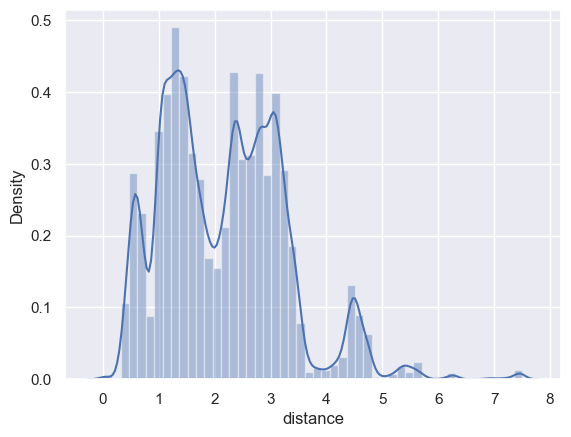

In [31]:
sns.distplot(final_dataframe['distance'])
plt.show

In [32]:
final_dataframe = drop_outlier(final_dataframe, 'distance')

c:\Users\adaog\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<function matplotlib.pyplot.show(close=None, block=None)>

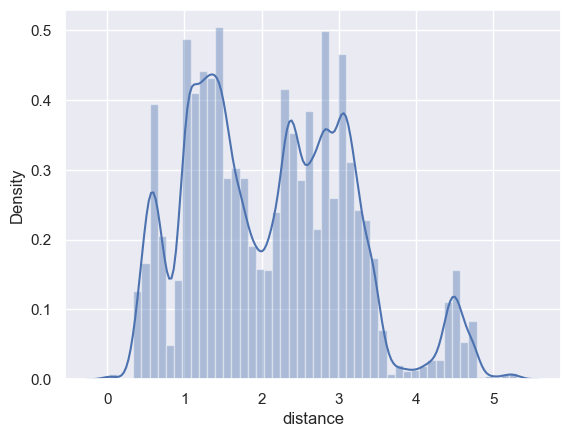

In [33]:
sns.distplot(final_dataframe['distance'])
plt.show

In [34]:
final_dataframe['distance'].mean()

2.1192926784789567

In [35]:
# Group the data by 'Hour' and calculate the mean of 'Surge Multiplier' for each hour
hourly_average = final_dataframe.groupby('hour')['surge_multiplier'].mean().reset_index()

print(hourly_average)



    hour  surge_multiplier
0      0          1.009284
1      1          1.011562
2      2          1.010760
3      3          1.013035
4      4          1.009430
5      5          1.009931
6      6          1.010704
7      7          1.013386
8      8          1.011936
9      9          1.013931
10    10          1.015239
11    11          1.010053
12    12          1.010921
13    13          1.014999
14    14          1.009924
15    15          1.013877
16    16          1.007425
17    17          1.010928
18    18          1.014343
19    19          1.013441
20    20          1.017092
21    21          1.011848
22    22          1.008680
23    23          1.010695


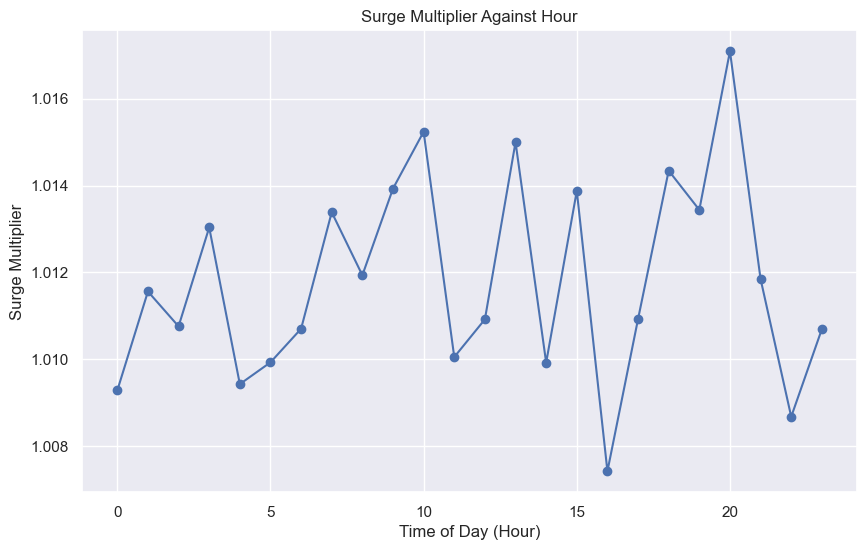

In [36]:

# Create a line plot for mean time of day vs. surge multiplier
plt.figure(figsize=(10, 6))
plt.plot(hourly_average['hour'], hourly_average['surge_multiplier'], marker='o', linestyle='-')
plt.title('Surge Multiplier Against Hour')
plt.xlabel('Time of Day (Hour)')
plt.ylabel('Surge Multiplier')
plt.grid(True)
plt.show()


# graph shows us time of day where surge is at the highest and lowest

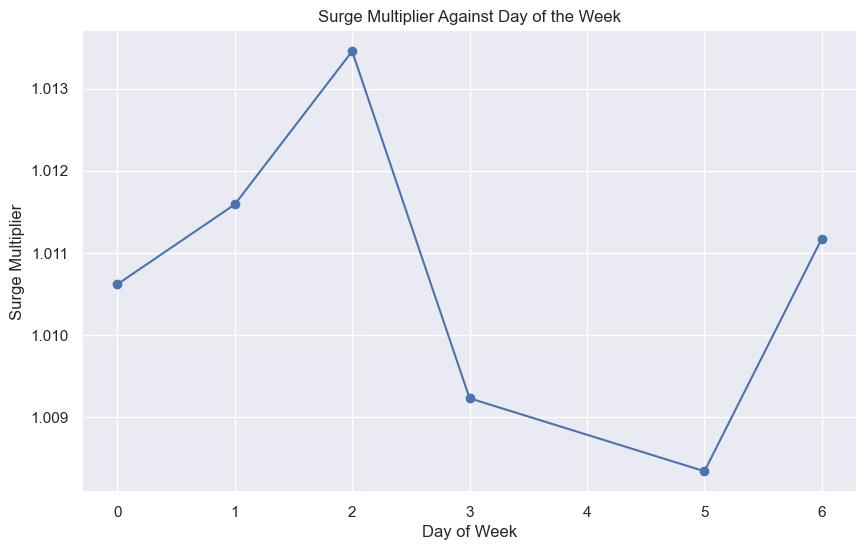

In [37]:
# Calculating average day of the week against surge multiplier
day_average = final_dataframe.groupby('day')['surge_multiplier'].mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(day_average['day'], day_average['surge_multiplier'], marker='o', linestyle='-')
plt.title('Surge Multiplier Against Day of the Week')
plt.xlabel('Day of Week')
plt.ylabel('Surge Multiplier')
plt.grid(True)
plt.show()

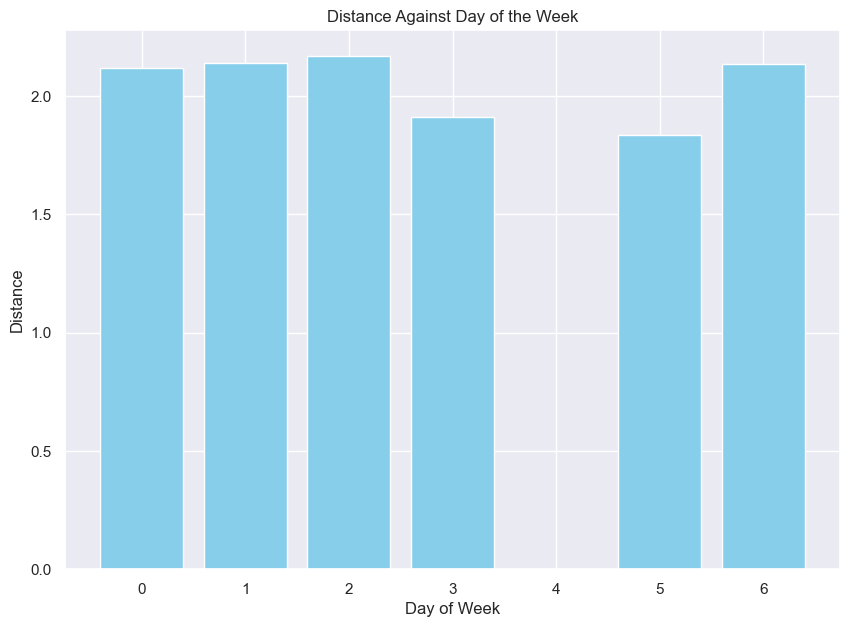

In [38]:
# Calculating average day of the week against distance
day_average = final_dataframe.groupby('day')['distance'].mean().reset_index()
plt.figure(figsize=(10, 7))
plt.bar(day_average['day'], day_average['distance'], color='skyblue')
plt.title('Distance Against Day of the Week')
plt.xlabel('Day of Week')
plt.ylabel('Distance')
plt.grid(True)
plt.show()

In [39]:
day_average = final_dataframe.groupby('day')['price'].mean().reset_index()
day_average

,day,price
0,0,16.155822
1,1,16.206079
2,2,16.340249
3,3,15.537764
4,5,15.501774
5,6,16.132953


In [40]:
y = day_average['price']
x = day_average['day']

fig = px.bar(x=x, y=y, 
                      labels= {'x': 'Day', 'y': 'Avg Price'}, 
                      title = 'Average Price Distribution by Day of the week',
                      color_discrete_sequence=['skyblue'], text=round(y,2))
fig.update_layout(title = {'font':{'size':23}})
        
fig.update_layout(height = 500, width = 750)

fig.show()

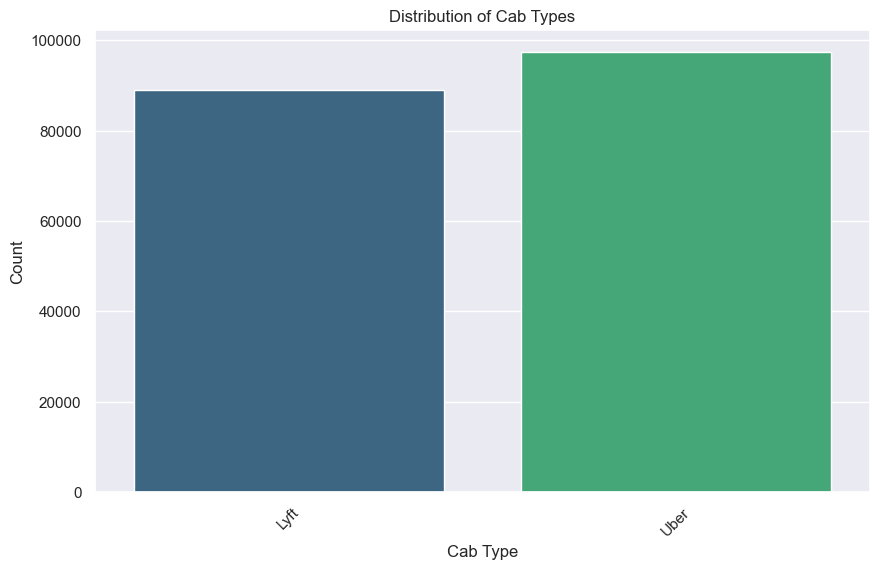

In [41]:
# bar chart for cab type distribution
plt.figure(figsize=(10, 6))
sns.countplot(data=final_dataframe, x='cab_type', palette='viridis')
plt.title('Distribution of Cab Types')
plt.xlabel('Cab Type')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

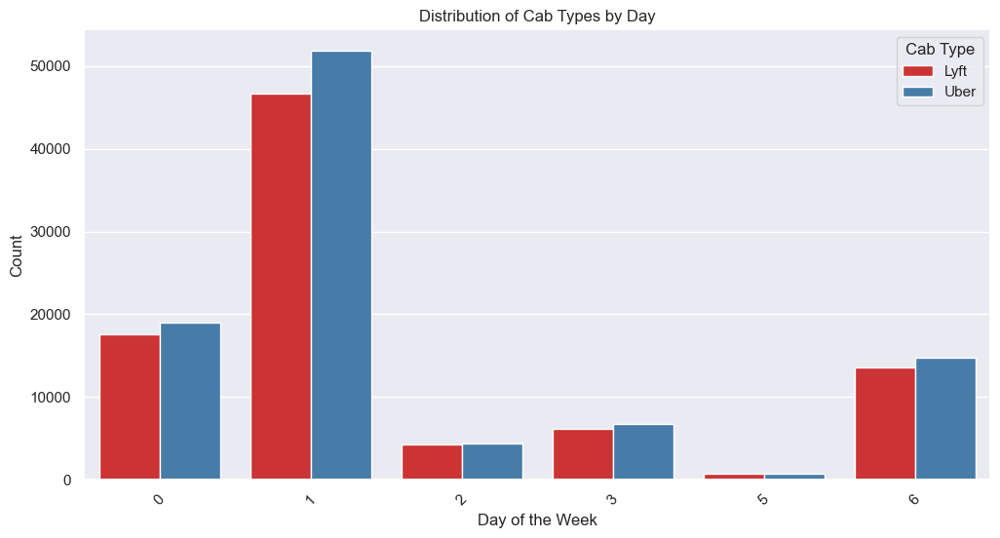

In [42]:
# Create a stacked bar chart for day vs. cab type
plt.figure(figsize=(12, 6))
sns.countplot(data=final_dataframe, x='day', hue='cab_type', palette='Set1')
plt.title('Distribution of Cab Types by Day')
plt.xlabel('Day of the Week')
plt.ylabel('Count')
plt.legend(title='Cab Type', loc='upper right')
plt.xticks(rotation=45)
plt.show()


# shows that uber is generally ordered more but with a very little margin difference

In [43]:
final_dataframe['day'].unique()

array([1, 6, 0, 2, 3, 5], dtype=int64)

### Split Data

In [44]:
train,test = train_test_split(final_dataframe, test_size = 0.2, random_state =123)

In [45]:
train.head()

,distance,cab_type,destination,source,price,surge_multiplier,name,temp,clouds,pressure,rain,humidity,wind,day,hour
154095,2.62,Uber,Boston University,Theatre District,9.5,1.0,WAV,40.98,0.11,1006.20,0.0030,0.59,10.52,3,13
43285,1.24,Lyft,Theatre District,Haymarket Square,26.0,1.0,Lux Black XL,47.39,1.00,1007.49,0.0058,0.96,5.25,6,17
63797,1.91,Lyft,North Station,South Station,3.5,1.0,Shared,38.65,0.50,997.93,0.0020,0.70,10.51,3,2
167410,1.30,Uber,Theatre District,South Station,27.5,1.0,Black SUV,43.02,0.90,1014.56,0.0030,0.91,3.79,0,14
22004,2.65,Lyft,South Station,Back Bay,19.5,1.0,Lux,38.56,0.58,997.64,0.0020,0.70,9.88,3,1


In [46]:
train.shape

(149171, 15)

In [47]:
test.shape

(37293, 15)

In [48]:
#A1

train.reset_index(drop=True, inplace=True)
train.head()

,distance,cab_type,destination,source,price,surge_multiplier,name,temp,clouds,pressure,rain,humidity,wind,day,hour
0,2.62,Uber,Boston University,Theatre District,9.5,1.0,WAV,40.98,0.11,1006.20,0.0030,0.59,10.52,3,13
1,1.24,Lyft,Theatre District,Haymarket Square,26.0,1.0,Lux Black XL,47.39,1.00,1007.49,0.0058,0.96,5.25,6,17
2,1.91,Lyft,North Station,South Station,3.5,1.0,Shared,38.65,0.50,997.93,0.0020,0.70,10.51,3,2
3,1.30,Uber,Theatre District,South Station,27.5,1.0,Black SUV,43.02,0.90,1014.56,0.0030,0.91,3.79,0,14
4,2.65,Lyft,South Station,Back Bay,19.5,1.0,Lux,38.56,0.58,997.64,0.0020,0.70,9.88,3,1


In [49]:
#A2
from sklearn.preprocessing import OneHotEncoder

# Create the OneHotEncoder
encoder = OneHotEncoder(drop="first", dtype='int')

# Use the same encoders used for training data
enc_data = pd.DataFrame(encoder.fit_transform(np.array(train[['destination', 'source', 
                                                                        'name', 'cab_type']])).toarray(), 
                                                                        columns=encoder.get_feature_names_out(['destination', 'source', 'name', 'cab_type']))

# Concatenate the encoded features
train = pd.concat([train, enc_data], axis=1)

# Drop the original categorical columns
train.drop(['destination', 'source', 'name', 'cab_type'], axis=1, inplace=True)

train 

,distance,price,surge_multiplier,temp,clouds,pressure,rain,humidity,wind,day,hour,destination_Beacon Hill,destination_Boston University,destination_Fenway,destination_Financial District,destination_Haymarket Square,destination_North End,destination_North Station,destination_Northeastern University,destination_South Station,destination_Theatre District,destination_West End,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,source_North Station,source_Northeastern University,source_South Station,source_Theatre District,source_West End,name_Black SUV,name_Lux,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV,cab_type_Uber
0,2.62,9.5,1.0,40.98,0.11,1006.20,0.0030,0.59,10.52,3,13,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1
1,1.24,26.0,1.0,47.39,1.00,1007.49,0.0058,0.96,5.25,6,17,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,1.91,3.5,1.0,38.65,0.50,997.93,0.0020,0.70,10.51,3,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,1.30,27.5,1.0,43.02,0.90,1014.56,0.0030,0.91,3.79,0,14,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1
4,2.65,19.5,1.0,38.56,0.58,997.64,0.0020,0.70,9.88,3,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149166,3.22,16.5,1.0,43.84,0.98,1005.91,0.1495,0.91,9.84,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
149167,0.99,6.5,1.0,44.68,0.97,1008.14,0.0866,0.87,9.26,0,22,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
149168,0.39,7.0,1.0,44.78,1.00,1006.37,0.0587,0.88,9.79,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
149169,2.46,5.0,1.0,43.89,1.00,997.48,0.0127,0.91,11.37,1,6,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [50]:
train.head(2)

,distance,price,surge_multiplier,temp,clouds,pressure,rain,humidity,wind,day,hour,destination_Beacon Hill,destination_Boston University,destination_Fenway,destination_Financial District,destination_Haymarket Square,destination_North End,destination_North Station,destination_Northeastern University,destination_South Station,destination_Theatre District,destination_West End,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,source_North Station,source_Northeastern University,source_South Station,source_Theatre District,source_West End,name_Black SUV,name_Lux,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV,cab_type_Uber
0,2.62,9.5,1.0,40.98,0.11,1006.20,0.0030,0.59,10.52,3,13,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1
1,1.24,26.0,1.0,47.39,1.00,1007.49,0.0058,0.96,5.25,6,17,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


### Feature Engineering

In [51]:
## multiply distance by time of day to create a new feature that could better predict price based on peak and off peak periods

#A3

def timedist (df,dist_col,hour_col):
    new = []

    df['time_distance'] = df[dist_col] * df[hour_col]

    return df



In [52]:
#A4

timedist (train, 'distance', 'hour')

,distance,price,surge_multiplier,temp,clouds,pressure,rain,humidity,wind,day,hour,destination_Beacon Hill,destination_Boston University,destination_Fenway,destination_Financial District,destination_Haymarket Square,destination_North End,destination_North Station,destination_Northeastern University,destination_South Station,destination_Theatre District,destination_West End,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,source_North Station,source_Northeastern University,source_South Station,source_Theatre District,source_West End,name_Black SUV,name_Lux,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV,cab_type_Uber,time_distance
0,2.62,9.5,1.0,40.98,0.11,1006.20,0.0030,0.59,10.52,3,13,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,34.06
1,1.24,26.0,1.0,47.39,1.00,1007.49,0.0058,0.96,5.25,6,17,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,21.08
2,1.91,3.5,1.0,38.65,0.50,997.93,0.0020,0.70,10.51,3,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,3.82
3,1.30,27.5,1.0,43.02,0.90,1014.56,0.0030,0.91,3.79,0,14,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,18.20
4,2.65,19.5,1.0,38.56,0.58,997.64,0.0020,0.70,9.88,3,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149166,3.22,16.5,1.0,43.84,0.98,1005.91,0.1495,0.91,9.84,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.00
149167,0.99,6.5,1.0,44.68,0.97,1008.14,0.0866,0.87,9.26,0,22,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,21.78
149168,0.39,7.0,1.0,44.78,1.00,1006.37,0.0587,0.88,9.79,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0.00
149169,2.46,5.0,1.0,43.89,1.00,997.48,0.0127,0.91,11.37,1,6,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,14.76


In [53]:
#A5
x_train = train.drop('price', axis =1)
y_train = train['price']

In [54]:
#A6
col = x_train.columns
col

Index(['distance', 'surge_multiplier', 'temp', 'clouds', 'pressure', 'rain', 'humidity', 'wind', 'day', 'hour', 'destination_Beacon Hill', 'destination_Boston University', 'destination_Fenway', 'destination_Financial District', 'destination_Haymarket Square', 'destination_North End', 'destination_North Station', 'destination_Northeastern University', 'destination_South Station', 'destination_Theatre District', 'destination_West End', 'source_Beacon Hill', 'source_Boston University', 'source_Fenway', 'source_Financial District', 'source_Haymarket Square', 'source_North End', 'source_North Station', 'source_Northeastern University', 'source_South Station', 'source_Theatre District', 'source_West End', 'name_Black SUV', 'name_Lux', 'name_Lux Black', 'name_Lux Black XL', 'name_Lyft', 'name_Lyft XL', 'name_Shared', 'name_UberPool', 'name_UberX', 'name_UberXL', 'name_WAV', 'cab_type_Uber', 'time_distance'], dtype='object')

In [55]:
#scaling the features
#A7

from sklearn.preprocessing import MinMaxScaler
Scaler = MinMaxScaler()
x_train = Scaler.fit_transform(x_train)

x_train = pd.DataFrame(x_train,columns=col)
x_train.head()

,distance,surge_multiplier,temp,clouds,pressure,rain,humidity,wind,day,hour,destination_Beacon Hill,destination_Boston University,destination_Fenway,destination_Financial District,destination_Haymarket Square,destination_North End,destination_North Station,destination_Northeastern University,destination_South Station,destination_Theatre District,destination_West End,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,source_North Station,source_Northeastern University,source_South Station,source_Theatre District,source_West End,name_Black SUV,name_Lux,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV,cab_type_Uber,time_distance
0,0.491493,0.0,0.401400,0.011111,0.525852,0.003587,0.152174,0.569390,0.5,0.565217,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.279409
1,0.230624,0.0,0.775379,1.000000,0.565085,0.007175,0.956522,0.227626,1.0,0.739130,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.172929
2,0.357278,0.0,0.265461,0.444444,0.274331,0.002306,0.391304,0.568742,0.5,0.086957,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.031337
3,0.241966,0.0,0.520420,0.888889,0.780109,0.003587,0.847826,0.132944,0.0,0.608696,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.149303
4,0.497164,0.0,0.260210,0.533333,0.265511,0.002306,0.391304,0.527886,0.5,0.043478,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.021739


In [56]:
conti_feat = ['distance', 'surge_multiplier', 'temp', 'clouds', 
'pressure', 'rain', 'humidity', 'wind', 'day', 'hour', 'time_distance']

<function matplotlib.pyplot.show(close=None, block=None)>

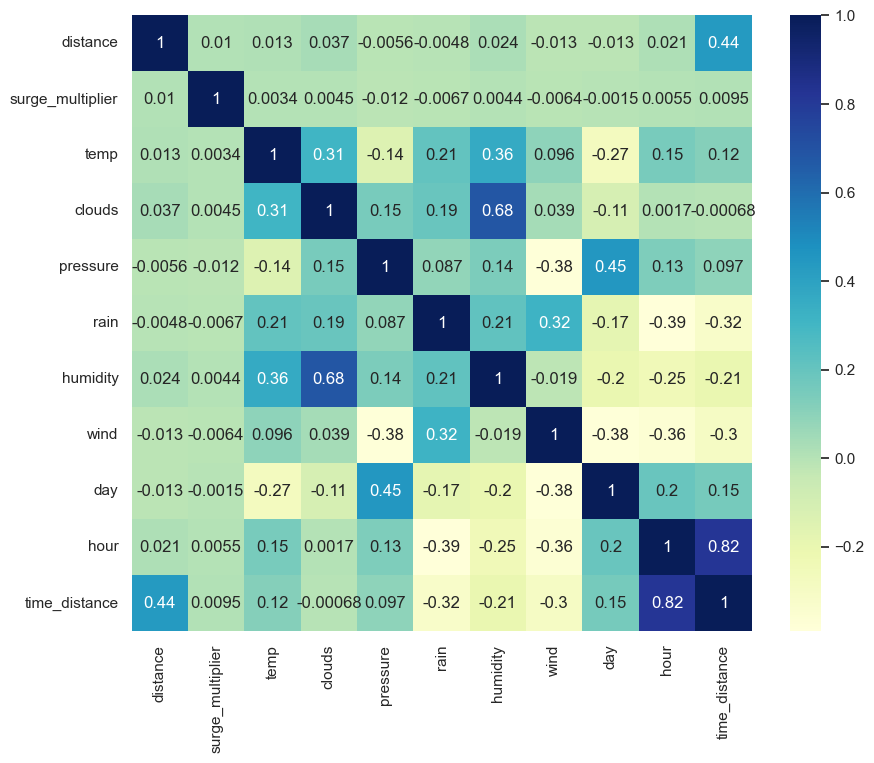

In [57]:
# Checking features for correlation

plt.figure(figsize = (10,8))
corre = train[conti_feat].corr()
sns.heatmap(corre,annot = True, cmap = 'YlGnBu')
plt.show

In [58]:
# check level of importance of features to target variable

from sklearn.feature_selection import mutual_info_regression

mu=mutual_info_regression(x_train,y_train)
imp = pd.DataFrame(mu,index=x_train.columns)

imp.columns=['Importance']
imp.sort_values(by='Importance',ascending=False)

,Importance
distance,0.570398
cab_type_Uber,0.399643
time_distance,0.353437
name_Black SUV,0.195041
name_Shared,0.188556
name_Lux Black XL,0.177778
name_UberPool,0.139132
name_Lux Black,0.112619
name_Lyft,0.104196
name_UberXL,0.103262


In [59]:
# dropping time_distance column due to correlation
x_train.drop('time_distance', axis=1, inplace=True)

In [60]:
def preparetest(df):

    
    df.reset_index(drop=True, inplace=True)
    
        

    # Use the same encoders used for training data
    enc_data = pd.DataFrame(encoder.transform(np.array(df[['destination', 'source', 
                                                                            'name', 'cab_type']])).toarray(), 
                                                                            columns=encoder.get_feature_names_out(['destination', 'source', 'name', 'cab_type']))

    # Concatenate the encoded features
    df = pd.concat([df, enc_data], axis=1)

    # Drop the original categorical columns
    df.drop(['destination', 'source', 'name', 'cab_type'], axis=1, inplace=True)

    

   


    def timedist (df,dist_col,hour_col):
        new = []

        df['time_distance'] = df[dist_col] * df[hour_col]

        return df
    

    timedist (df, 'distance', 'hour')


    x_test = df.drop('price', axis =1)
    y_test = df['price']
   

    col = x_test.columns

    x_test = Scaler.transform(x_test)

    x_test = pd.DataFrame(x_test,columns=col)

    x_test.drop('time_distance', axis=1, inplace=True)

   
    return x_test, y_test
    


In [61]:
x_test, y_test = preparetest(test)

In [62]:
preparetest(test)

(       distance  surge_multiplier      temp    clouds  pressure      rain  humidity      wind       day      hour  destination_Beacon Hill  destination_Boston University  destination_Fenway  destination_Financial District  destination_Haymarket Square  destination_North End  destination_North Station  destination_Northeastern University  destination_South Station  destination_Theatre District  destination_West End  source_Beacon Hill  source_Boston University  source_Fenway  source_Financial District  source_Haymarket Square  source_North End  source_North Station  source_Northeastern University  source_South Station  source_Theatre District  source_West End  name_Black SUV  name_Lux  name_Lux Black  name_Lux Black XL  name_Lyft  name_Lyft XL  name_Shared  name_UberPool  name_UberX  name_UberXL  name_WAV  cab_type_Uber
 0      0.103970               0.0  0.609685  1.000000  0.242092  0.035234  0.847826  0.748379  0.166667  0.260870                      0.0                            0

In [63]:
# function for different algorithms to be use

def model_to_use(input_ml_algo):
    if input_ml_algo == 'DT':
        algo = DecisionTreeRegressor()
    elif input_ml_algo == 'RF':
        algo = RandomForestRegressor()
    elif input_ml_algo == 'XGBR':
        algo = XGBRegressor()
    elif input_ml_algo == 'LGBMR':
        algo = LGBMRegressor()
    elif input_ml_algo=='LR':
        algo = LinearRegression()
    return algo

In [78]:
def evaluate(model):



    y_train_pred = model.predict(x_train) 
    y_pred = model.predict(x_test) 

    
    from sklearn.linear_model import Ridge

    
    # regularize model with L2 regularization
    ridge = Ridge(alpha=1.0)  

    # fitting the model to the training data
    ridge.fit(x_train, y_train)

    y_pred = ridge.predict(x_test)

   
    #MAE
    print('Train_MAE: ', mean_absolute_error(y_train,y_train_pred))
    print('Test_MAE: ', mean_absolute_error(y_test,y_pred))

    
    # Calculate the IQR for the predicted values
    iqr_train_predicted = np.percentile(y_train_pred, 75) - np.percentile(y_train_pred, 25)
    iqr_test_predicted = np.percentile(y_pred, 75) - np.percentile(y_pred, 25)

    print("\n")
    print("Train Predicted Values IQR:", iqr_train_predicted)
    print("Test Predicted Values IQR:", iqr_test_predicted)


    # Calculate the Median Absolute Error (MedAE) for the training and test sets
    medae_train = median_absolute_error(y_train, y_train_pred)
    medae_test = median_absolute_error(y_test, y_pred)

    print("\n")
    print("Median Absolute Error (MedAE) for Training Set:", medae_train)
    print("Median Absolute Error (MedAE) for Test Set:", medae_test)



    #R2
    print("\n")
    print('Train r2 score: ', r2_score(y_train,y_train_pred))
    print('Test r2 score: ', r2_score(y_test, y_pred))



    # Huber loss
    huber = HuberRegressor(max_iter=1000)
    model = HuberRegressor(max_iter=1000)

    # Fit the model to the training data
    huber.fit(x_train, y_train)

    # Predict on the testing data
    y_pred = huber.predict(x_test)

    # Calculate the Huber loss on the testing data
    huber_loss = mean_absolute_error(y_test, y_pred)

    print("\n")
    print(f'Huber Loss: {huber_loss:.2f}')


In [79]:
model1 = model_to_use('LR')
model1.fit(x_train,y_train)
evaluate(model1)

Train_MAE:  1.6075835226041966
Test_MAE:  1.60984762474268


Train Predicted Values IQR: 12.357421875
Test Predicted Values IQR: 12.378730230017467


Median Absolute Error (MedAE) for Training Set: 1.291748046875
Median Absolute Error (MedAE) for Test Set: 1.287540049341306


Train r2 score:  0.9385226722776088
Test r2 score:  0.938814953545309


Huber Loss: 1.59


In [66]:
model2 = model_to_use('DT')
model2.fit(x_train, y_train)
evaluate(model2)

Train_MAE:  0.31935577619390154
Test_MAE:  1.60984762474268


Train Predicted Values IQR: 13.5
Test Predicted Values IQR: 12.378730230017467


Median Absolute Error (MedAE) for Training Set: 0.0
Median Absolute Error (MedAE) for Test Set: 1.287540049341306


Train r2 score:  0.9917661632200614
Test r2 score:  0.938814953545309


Huber Loss: 1.59


In [67]:
model3 = model_to_use('RF')
model3.fit(x_train,y_train)
evaluate(model3)

Train_MAE:  0.5074703050470328
Test_MAE:  1.60984762474268


Train Predicted Values IQR: 13.308728174603177
Test Predicted Values IQR: 12.378730230017467


Median Absolute Error (MedAE) for Training Set: 0.2749999999999986
Median Absolute Error (MedAE) for Test Set: 1.287540049341306


Train r2 score:  0.9896359566141886
Test r2 score:  0.938814953545309


Huber Loss: 1.59


In [68]:
model4 = model_to_use('XGBR')
model4.fit(x_train, y_train)
evaluate(model4)

Train_MAE:  0.9828276504866665
Test_MAE:  1.60984762474268


Train Predicted Values IQR: 12.886171340942383
Test Predicted Values IQR: 12.378730230017467


Median Absolute Error (MedAE) for Training Set: 0.7243938446044922
Median Absolute Error (MedAE) for Test Set: 1.287540049341306


Train r2 score:  0.9731883082553293
Test r2 score:  0.938814953545309


Huber Loss: 1.59


In [69]:
model5 = model_to_use('LGBMR')
model5.fit(x_train, y_train)
evaluate(model5)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1428
[LightGBM] [Info] Number of data points in the train set: 149171, number of used features: 44
[LightGBM] [Info] Start training from score 16.127300
Train_MAE:  1.066876064279632
Test_MAE:  1.60984762474268


Train Predicted Values IQR: 12.921411144491202
Test Predicted Values IQR: 12.378730230017467


Median Absolute Error (MedAE) for Training Set: 0.7754839930618438
Median Absolute Error (MedAE) for Test Set: 1.287540049341306


Train r2 score:  0.9683626423210199
Test r2 score:  0.938814953545309


Huber Loss: 1.59


In [80]:
from pickle import dump

dump(model1, open('lr_model.pkl', 'wb'))

dump(encoder, open('lr_enc.pkl', 'wb'))

dump(Scaler, open('lr_scaler.pkl', 'wb'))

In [71]:
x_train.columns

Index(['distance', 'surge_multiplier', 'temp', 'clouds', 'pressure', 'rain', 'humidity', 'wind', 'day', 'hour', 'destination_Beacon Hill', 'destination_Boston University', 'destination_Fenway', 'destination_Financial District', 'destination_Haymarket Square', 'destination_North End', 'destination_North Station', 'destination_Northeastern University', 'destination_South Station', 'destination_Theatre District', 'destination_West End', 'source_Beacon Hill', 'source_Boston University', 'source_Fenway', 'source_Financial District', 'source_Haymarket Square', 'source_North End', 'source_North Station', 'source_Northeastern University', 'source_South Station', 'source_Theatre District', 'source_West End', 'name_Black SUV', 'name_Lux', 'name_Lux Black', 'name_Lux Black XL', 'name_Lyft', 'name_Lyft XL', 'name_Shared', 'name_UberPool', 'name_UberX', 'name_UberXL', 'name_WAV', 'cab_type_Uber'], dtype='object')

In [72]:
cat =['distance', 'surge_multiplier', 'temp', 'clouds', 'pressure', 'rain', 'humidity', 'wind', 'day', 'cab_type_Uber', 'destination_Beacon Hill', 'destination_Boston University', 'destination_Fenway', 'destination_Financial District', 'destination_Haymarket Square', 'destination_North End', 'destination_North Station', 'destination_Northeastern University', 'destination_South Station', 'destination_Theatre District', 'destination_West End', 'source_Beacon Hill', 'source_Boston University', 'source_Fenway', 'source_Financial District', 'source_Haymarket Square', 'source_North End', 'source_North Station', 'source_Northeastern University', 'source_South Station', 'source_Theatre District', 'source_West End', 'name_Black SUV', 'name_Lux', 'name_Lux Black', 'name_Lux Black XL', 'name_Lyft', 'name_Lyft XL', 'name_Shared', 'name_UberPool', 'name_UberX', 'name_UberXL', 'name_WAV', 'time_distance']

In [73]:
len(cat)

44

In [74]:
final_dataframe.head()

,distance,cab_type,destination,source,price,surge_multiplier,name,temp,clouds,pressure,rain,humidity,wind,day,hour
0,0.44,Lyft,North Station,Haymarket Square,11.0,1.0,Lux,44.31,1.00,1003.17,0.1123,0.90,13.69,1,2
1,0.44,Lyft,North Station,Haymarket Square,11.0,1.0,Lux,43.82,0.99,1002.59,0.0997,0.89,11.57,1,2
2,1.08,Lyft,Northeastern University,Back Bay,27.5,1.0,Lux Black XL,44.56,0.99,990.78,0.0213,0.96,5.87,1,10
3,1.08,Lyft,Northeastern University,Back Bay,27.5,1.0,Lux Black XL,44.95,0.99,990.87,0.0087,0.97,6.14,1,10
4,1.11,Uber,West End,North End,7.5,1.0,WAV,42.36,1.00,1012.15,0.2088,0.77,11.46,6,23


In [75]:
final_dataframe['hour'].unique()

array([ 2, 10, 23, 16,  3, 18,  9,  8, 14,  1,  7, 21, 22, 12, 17, 13,  5,
        4,  0, 20, 11,  6, 15, 19], dtype=int64)

In [76]:
final_dataframe.columns

Index(['distance', 'cab_type', 'destination', 'source', 'price', 'surge_multiplier', 'name', 'temp', 'clouds', 'pressure', 'rain', 'humidity', 'wind', 'day', 'hour'], dtype='object')

In [81]:
!streamlit run pricepredict.py

^C
